# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

Un sous-répertoire ou un fichier data existe déjà.


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

SVHN Training Set: 182MB [03:56, 769KB/s]                                      
SVHN Testing Set: 64.3MB [01:13, 872KB/s]                                      


These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

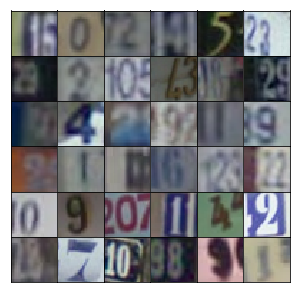

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [6]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [7]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [8]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3. 

>**Exercise:** Build the transposed convolutional network for the generator in the function below. Be sure to use leaky ReLUs on all the layers except for the last tanh layer, as well as batch normalization on all the transposed convolutional layers except the last one.

In [33]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        full_connect = tf.layers.dense(z, 4 * 4 * 512)
        x_reshape = tf.reshape(full_connect, [-1, 4, 4, 512])
        x_batch_norm = tf.layers.batch_normalization(x_reshape, training=training)
        x = tf.maximum(alpha*x_batch_norm, x_batch_norm)
        
        # first transposeconvolutionnal network -> 8, 8, 256
        c1 = tf.layers.conv2d_transpose(x, 256, 5, strides=2, padding='SAME')
        b1 = tf.layers.batch_normalization(c1, training=training)
        a1 =  tf.maximum(alpha*b1, b1)

        # second transposeconvolutionnal network -> 16, 16, 64
        c2 = tf.layers.conv2d_transpose(a1, 128, 5, strides=2, padding='SAME')
        b2 = tf.layers.batch_normalization(c2, training=training)
        a2 =  tf.maximum(alpha*b2, b2)

        # Output layer, 32x32x3
        logits = tf.layers.conv2d_transpose(a2, output_dim, 5, strides=2, padding='SAME')
        
        out = tf.tanh(logits)
        
        return out


## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've built before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU.

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

>**Exercise:** Build the convolutional network for the discriminator. The input is a 32x32x3 images, the output is a sigmoid plus the logits. Again, use Leaky ReLU activations and batch normalization on all the layers except the first.

In [34]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        c1 = tf.layers.conv2d(x, 64, 5, strides=2, padding='same')
        c1 = tf.maximum(c1 * alpha, c1)
        # 16x16x64
        
        c2 = tf.layers.conv2d(c1, 128, 5, strides=2, padding='same')
        c2 = tf.layers.batch_normalization(c2, training=True)
        c2 = tf.maximum(c2 * alpha, c2)
        # 8x8x128
        
        c3 = tf.layers.conv2d(c2, 256, 5, strides=2, padding='same')
        c3 = tf.layers.batch_normalization(c3, training=True)
        c3 = tf.maximum(c3 * alpha, c3)
        # 4x4x256
                              
        c3_reshape = tf.reshape(c3, [-1, 4 * 4 * 256])
        
        logits = tf.layers.dense(c3_reshape, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [35]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [36]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [37]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=alpha)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [38]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [39]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

>**Exercise:** Find hyperparameters to train this GAN. The values found in the DCGAN paper work well, or you can experiment on your own. In general, you want the discriminator loss to be around 0.3, this means it is correctly classifying images as fake or real about 50% of the time.

In [42]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.001
batch_size = 64
epochs = 1
alpha = 0.01
beta1 = 0.9

learning_rate = 0.0002
batch_size = 128
epochs = 25
alpha = 0.2
beta1 = 0.5

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

Epoch 1/25... Discriminator Loss: 1.1124... Generator Loss: 0.9185
Epoch 1/25... Discriminator Loss: 0.3539... Generator Loss: 2.2303
Epoch 1/25... Discriminator Loss: 0.1510... Generator Loss: 2.9482
Epoch 1/25... Discriminator Loss: 0.1101... Generator Loss: 3.1428
Epoch 1/25... Discriminator Loss: 0.1942... Generator Loss: 2.4127
Epoch 1/25... Discriminator Loss: 0.0838... Generator Loss: 3.1924
Epoch 1/25... Discriminator Loss: 0.2477... Generator Loss: 1.9321
Epoch 1/25... Discriminator Loss: 0.1317... Generator Loss: 3.0339
Epoch 1/25... Discriminator Loss: 0.1283... Generator Loss: 3.1697
Epoch 1/25... Discriminator Loss: 0.1091... Generator Loss: 3.3830


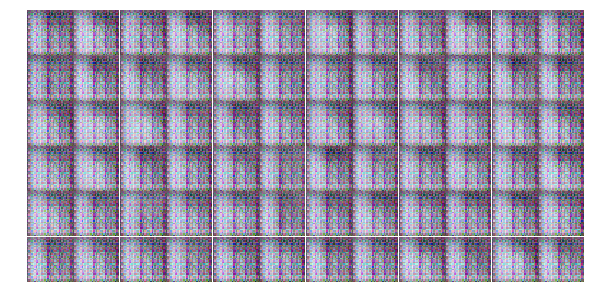

Epoch 1/25... Discriminator Loss: 0.2337... Generator Loss: 2.9633
Epoch 1/25... Discriminator Loss: 1.1089... Generator Loss: 0.5382
Epoch 1/25... Discriminator Loss: 0.8361... Generator Loss: 2.5669
Epoch 1/25... Discriminator Loss: 0.5772... Generator Loss: 1.8029
Epoch 1/25... Discriminator Loss: 0.4561... Generator Loss: 1.6912
Epoch 1/25... Discriminator Loss: 1.8221... Generator Loss: 6.6813
Epoch 1/25... Discriminator Loss: 0.2186... Generator Loss: 2.1916
Epoch 1/25... Discriminator Loss: 0.6451... Generator Loss: 4.4958
Epoch 1/25... Discriminator Loss: 0.4457... Generator Loss: 1.8508
Epoch 1/25... Discriminator Loss: 0.6696... Generator Loss: 3.4522


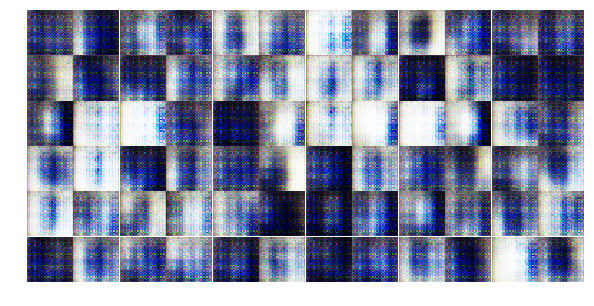

Epoch 1/25... Discriminator Loss: 1.9947... Generator Loss: 0.1866
Epoch 1/25... Discriminator Loss: 0.5076... Generator Loss: 2.4175
Epoch 1/25... Discriminator Loss: 0.5568... Generator Loss: 3.5105
Epoch 1/25... Discriminator Loss: 1.5654... Generator Loss: 0.4097
Epoch 1/25... Discriminator Loss: 0.5006... Generator Loss: 1.7138
Epoch 1/25... Discriminator Loss: 0.7100... Generator Loss: 2.6779
Epoch 1/25... Discriminator Loss: 0.4885... Generator Loss: 2.1885
Epoch 1/25... Discriminator Loss: 0.7536... Generator Loss: 0.9926
Epoch 1/25... Discriminator Loss: 0.8355... Generator Loss: 1.4301
Epoch 1/25... Discriminator Loss: 1.3703... Generator Loss: 1.0305


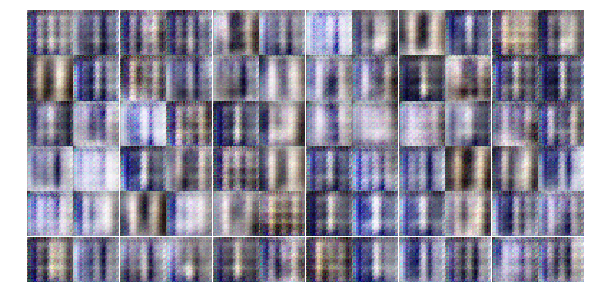

Epoch 1/25... Discriminator Loss: 0.8958... Generator Loss: 0.9991
Epoch 1/25... Discriminator Loss: 0.8427... Generator Loss: 0.9406
Epoch 1/25... Discriminator Loss: 0.4936... Generator Loss: 1.7731
Epoch 1/25... Discriminator Loss: 1.1250... Generator Loss: 0.7590
Epoch 1/25... Discriminator Loss: 0.4839... Generator Loss: 2.2276
Epoch 1/25... Discriminator Loss: 0.7970... Generator Loss: 0.9162
Epoch 1/25... Discriminator Loss: 0.5719... Generator Loss: 1.8164
Epoch 1/25... Discriminator Loss: 0.9021... Generator Loss: 1.6890
Epoch 1/25... Discriminator Loss: 0.7118... Generator Loss: 2.7425
Epoch 1/25... Discriminator Loss: 0.2224... Generator Loss: 3.0149


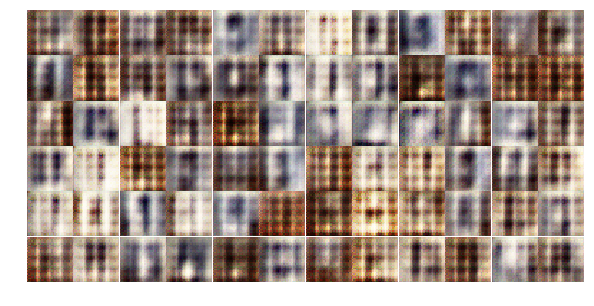

Epoch 1/25... Discriminator Loss: 0.3398... Generator Loss: 2.2323
Epoch 1/25... Discriminator Loss: 0.2568... Generator Loss: 2.0983
Epoch 1/25... Discriminator Loss: 0.3734... Generator Loss: 1.8121
Epoch 1/25... Discriminator Loss: 1.3224... Generator Loss: 3.9077
Epoch 1/25... Discriminator Loss: 0.5423... Generator Loss: 1.3821
Epoch 1/25... Discriminator Loss: 0.3442... Generator Loss: 1.7474
Epoch 1/25... Discriminator Loss: 0.2844... Generator Loss: 3.2455
Epoch 1/25... Discriminator Loss: 0.7135... Generator Loss: 4.1976
Epoch 1/25... Discriminator Loss: 0.4677... Generator Loss: 1.6569
Epoch 1/25... Discriminator Loss: 0.5597... Generator Loss: 1.1666


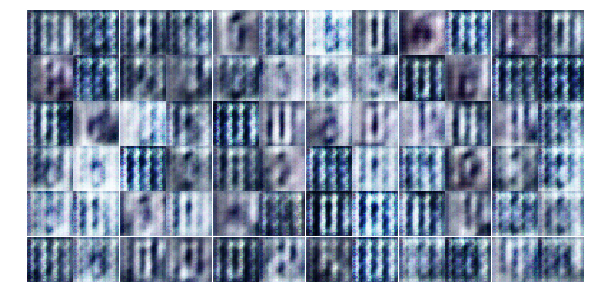

Epoch 1/25... Discriminator Loss: 0.6692... Generator Loss: 1.8396
Epoch 1/25... Discriminator Loss: 0.4238... Generator Loss: 2.1172
Epoch 1/25... Discriminator Loss: 0.7808... Generator Loss: 1.1093
Epoch 1/25... Discriminator Loss: 0.6408... Generator Loss: 2.4788
Epoch 1/25... Discriminator Loss: 0.7709... Generator Loss: 1.2810
Epoch 1/25... Discriminator Loss: 0.5740... Generator Loss: 1.7407
Epoch 1/25... Discriminator Loss: 0.4974... Generator Loss: 1.7824
Epoch 2/25... Discriminator Loss: 0.9385... Generator Loss: 0.8159
Epoch 2/25... Discriminator Loss: 0.5270... Generator Loss: 2.2397
Epoch 2/25... Discriminator Loss: 0.9337... Generator Loss: 2.4192


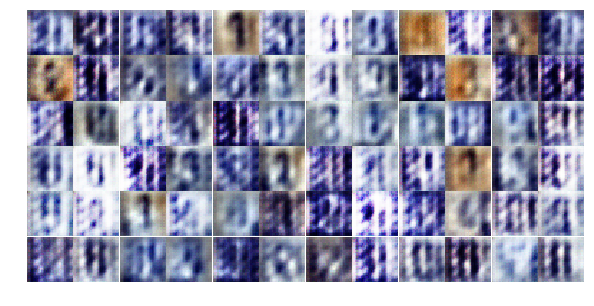

Epoch 2/25... Discriminator Loss: 0.6419... Generator Loss: 1.3606
Epoch 2/25... Discriminator Loss: 0.6899... Generator Loss: 1.5087
Epoch 2/25... Discriminator Loss: 0.7559... Generator Loss: 1.3883
Epoch 2/25... Discriminator Loss: 0.4241... Generator Loss: 2.0223
Epoch 2/25... Discriminator Loss: 0.6857... Generator Loss: 1.3296
Epoch 2/25... Discriminator Loss: 0.4826... Generator Loss: 2.0207
Epoch 2/25... Discriminator Loss: 0.8344... Generator Loss: 1.6561
Epoch 2/25... Discriminator Loss: 0.4211... Generator Loss: 1.9131
Epoch 2/25... Discriminator Loss: 0.9650... Generator Loss: 0.8685
Epoch 2/25... Discriminator Loss: 0.6844... Generator Loss: 1.1555


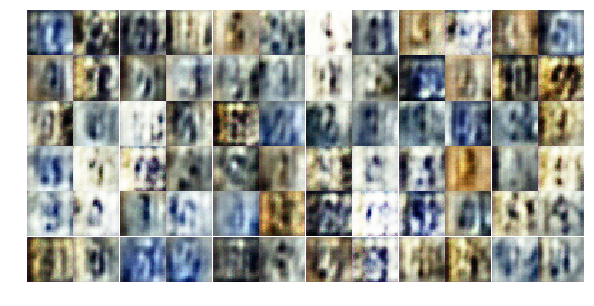

Epoch 2/25... Discriminator Loss: 2.0583... Generator Loss: 0.2446
Epoch 2/25... Discriminator Loss: 1.6145... Generator Loss: 2.4121
Epoch 2/25... Discriminator Loss: 1.0133... Generator Loss: 0.8278
Epoch 2/25... Discriminator Loss: 0.6644... Generator Loss: 1.7242
Epoch 2/25... Discriminator Loss: 0.6556... Generator Loss: 1.3770
Epoch 2/25... Discriminator Loss: 1.2743... Generator Loss: 1.1405
Epoch 2/25... Discriminator Loss: 1.0146... Generator Loss: 0.9860
Epoch 2/25... Discriminator Loss: 1.3302... Generator Loss: 0.5270
Epoch 2/25... Discriminator Loss: 1.1278... Generator Loss: 0.6298
Epoch 2/25... Discriminator Loss: 1.2618... Generator Loss: 0.7566


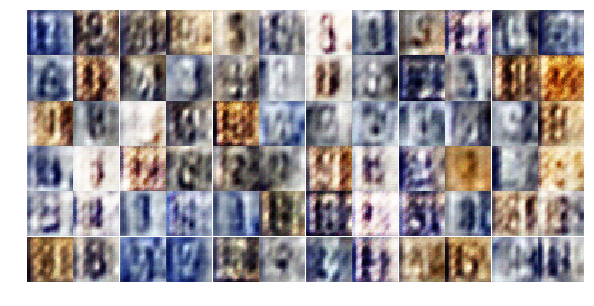

Epoch 2/25... Discriminator Loss: 0.8928... Generator Loss: 1.0892
Epoch 2/25... Discriminator Loss: 0.8706... Generator Loss: 0.9207
Epoch 2/25... Discriminator Loss: 0.5378... Generator Loss: 2.0510
Epoch 2/25... Discriminator Loss: 1.0193... Generator Loss: 0.6941
Epoch 2/25... Discriminator Loss: 0.7782... Generator Loss: 1.4273
Epoch 2/25... Discriminator Loss: 0.9876... Generator Loss: 1.5404
Epoch 2/25... Discriminator Loss: 0.9683... Generator Loss: 0.7843
Epoch 2/25... Discriminator Loss: 1.3280... Generator Loss: 0.5478
Epoch 2/25... Discriminator Loss: 0.9134... Generator Loss: 2.1315
Epoch 2/25... Discriminator Loss: 0.7232... Generator Loss: 1.1836


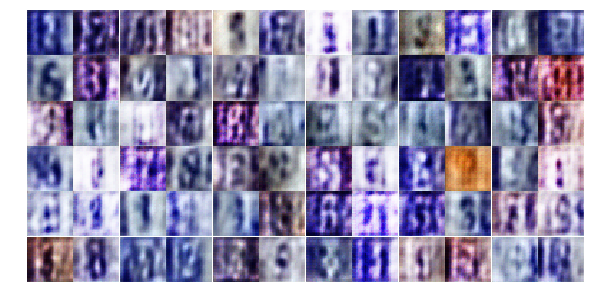

Epoch 2/25... Discriminator Loss: 0.8784... Generator Loss: 4.3709
Epoch 2/25... Discriminator Loss: 1.6174... Generator Loss: 2.2574
Epoch 2/25... Discriminator Loss: 1.0207... Generator Loss: 0.8767
Epoch 2/25... Discriminator Loss: 2.0087... Generator Loss: 0.1949
Epoch 2/25... Discriminator Loss: 1.1287... Generator Loss: 0.6338
Epoch 2/25... Discriminator Loss: 0.4877... Generator Loss: 1.8318
Epoch 2/25... Discriminator Loss: 0.4496... Generator Loss: 2.4624
Epoch 2/25... Discriminator Loss: 0.8221... Generator Loss: 1.7663
Epoch 2/25... Discriminator Loss: 0.6173... Generator Loss: 2.7373
Epoch 2/25... Discriminator Loss: 0.6149... Generator Loss: 3.3630


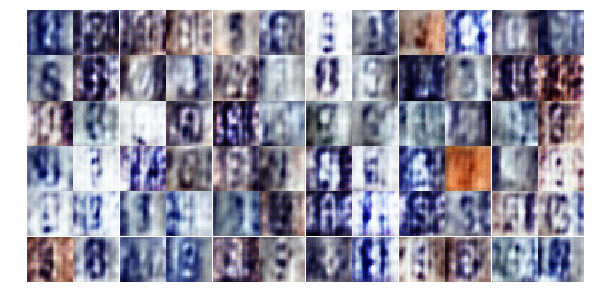

Epoch 2/25... Discriminator Loss: 0.8793... Generator Loss: 0.7580
Epoch 2/25... Discriminator Loss: 1.1159... Generator Loss: 1.2606
Epoch 2/25... Discriminator Loss: 0.3808... Generator Loss: 2.5538
Epoch 2/25... Discriminator Loss: 1.0945... Generator Loss: 1.2834
Epoch 2/25... Discriminator Loss: 1.4347... Generator Loss: 0.5520
Epoch 2/25... Discriminator Loss: 1.3021... Generator Loss: 0.5200
Epoch 2/25... Discriminator Loss: 0.2816... Generator Loss: 3.4851
Epoch 2/25... Discriminator Loss: 0.7313... Generator Loss: 1.9755
Epoch 2/25... Discriminator Loss: 0.5882... Generator Loss: 1.0616
Epoch 2/25... Discriminator Loss: 0.9393... Generator Loss: 0.7206


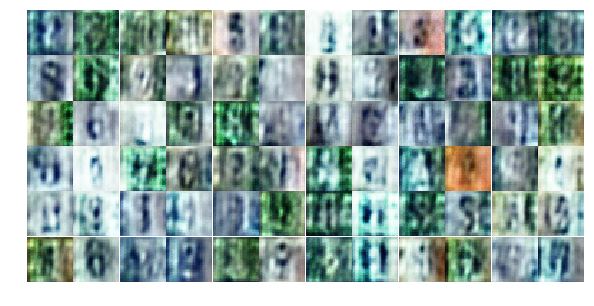

Epoch 2/25... Discriminator Loss: 0.2485... Generator Loss: 2.9910
Epoch 2/25... Discriminator Loss: 0.9226... Generator Loss: 3.7495
Epoch 2/25... Discriminator Loss: 0.3737... Generator Loss: 4.0770
Epoch 2/25... Discriminator Loss: 0.3241... Generator Loss: 1.8720
Epoch 3/25... Discriminator Loss: 0.9145... Generator Loss: 4.2207
Epoch 3/25... Discriminator Loss: 0.3558... Generator Loss: 1.7678
Epoch 3/25... Discriminator Loss: 0.2224... Generator Loss: 3.0781
Epoch 3/25... Discriminator Loss: 0.8487... Generator Loss: 0.7708
Epoch 3/25... Discriminator Loss: 0.5462... Generator Loss: 3.1325
Epoch 3/25... Discriminator Loss: 1.0213... Generator Loss: 0.6168


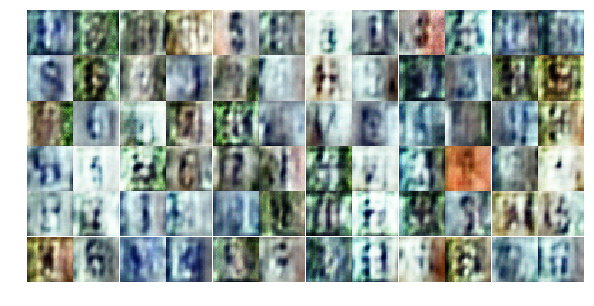

Epoch 3/25... Discriminator Loss: 0.8286... Generator Loss: 0.8050
Epoch 3/25... Discriminator Loss: 0.2254... Generator Loss: 2.6160
Epoch 3/25... Discriminator Loss: 1.4008... Generator Loss: 4.3857
Epoch 3/25... Discriminator Loss: 0.3617... Generator Loss: 7.2405
Epoch 3/25... Discriminator Loss: 0.7738... Generator Loss: 0.9176
Epoch 3/25... Discriminator Loss: 0.3213... Generator Loss: 4.3147
Epoch 3/25... Discriminator Loss: 0.3944... Generator Loss: 1.6907
Epoch 3/25... Discriminator Loss: 0.2328... Generator Loss: 4.3781
Epoch 3/25... Discriminator Loss: 0.4693... Generator Loss: 4.5276
Epoch 3/25... Discriminator Loss: 0.1619... Generator Loss: 4.2181


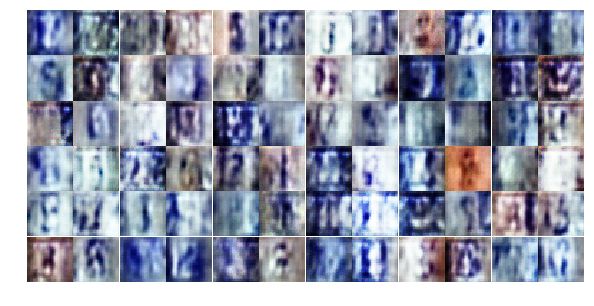

Epoch 3/25... Discriminator Loss: 0.3387... Generator Loss: 2.5656
Epoch 3/25... Discriminator Loss: 0.6530... Generator Loss: 1.1143
Epoch 3/25... Discriminator Loss: 0.2762... Generator Loss: 2.1444
Epoch 3/25... Discriminator Loss: 0.2260... Generator Loss: 2.7836
Epoch 3/25... Discriminator Loss: 1.0611... Generator Loss: 0.5893
Epoch 3/25... Discriminator Loss: 0.8983... Generator Loss: 0.9647
Epoch 3/25... Discriminator Loss: 1.1301... Generator Loss: 0.4851
Epoch 3/25... Discriminator Loss: 0.2377... Generator Loss: 3.7207
Epoch 3/25... Discriminator Loss: 0.6466... Generator Loss: 0.9074
Epoch 3/25... Discriminator Loss: 0.7168... Generator Loss: 4.4292


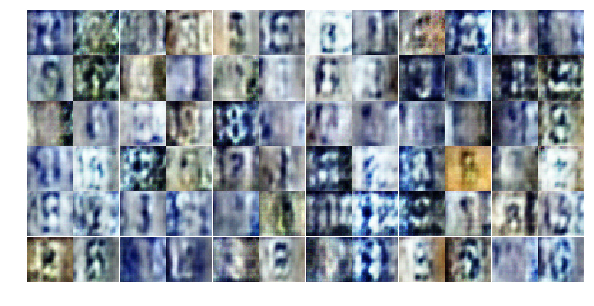

Epoch 3/25... Discriminator Loss: 0.4297... Generator Loss: 4.4447
Epoch 3/25... Discriminator Loss: 0.9152... Generator Loss: 0.7019
Epoch 3/25... Discriminator Loss: 0.0868... Generator Loss: 5.5096
Epoch 3/25... Discriminator Loss: 0.2936... Generator Loss: 2.0219
Epoch 3/25... Discriminator Loss: 0.2169... Generator Loss: 4.1275
Epoch 3/25... Discriminator Loss: 1.3989... Generator Loss: 5.7616
Epoch 3/25... Discriminator Loss: 0.2562... Generator Loss: 2.9275
Epoch 3/25... Discriminator Loss: 0.6044... Generator Loss: 1.0307
Epoch 3/25... Discriminator Loss: 0.3051... Generator Loss: 2.7433
Epoch 3/25... Discriminator Loss: 0.3272... Generator Loss: 1.7234


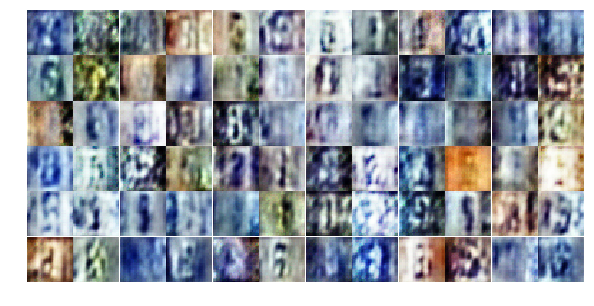

Epoch 3/25... Discriminator Loss: 0.7053... Generator Loss: 0.8887
Epoch 3/25... Discriminator Loss: 0.3241... Generator Loss: 2.4073
Epoch 3/25... Discriminator Loss: 0.1675... Generator Loss: 5.9287
Epoch 3/25... Discriminator Loss: 0.2594... Generator Loss: 2.3225
Epoch 3/25... Discriminator Loss: 1.1138... Generator Loss: 0.5478
Epoch 3/25... Discriminator Loss: 0.6771... Generator Loss: 0.9858
Epoch 3/25... Discriminator Loss: 0.6532... Generator Loss: 1.3406
Epoch 3/25... Discriminator Loss: 0.3617... Generator Loss: 3.6592
Epoch 3/25... Discriminator Loss: 0.2411... Generator Loss: 3.6228
Epoch 3/25... Discriminator Loss: 0.2156... Generator Loss: 3.7171


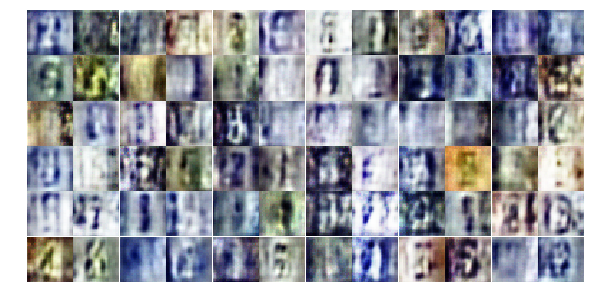

Epoch 3/25... Discriminator Loss: 0.2834... Generator Loss: 3.8109
Epoch 3/25... Discriminator Loss: 0.6803... Generator Loss: 0.9801
Epoch 3/25... Discriminator Loss: 0.3970... Generator Loss: 1.7267
Epoch 3/25... Discriminator Loss: 0.6772... Generator Loss: 5.0035
Epoch 3/25... Discriminator Loss: 0.2245... Generator Loss: 3.5254
Epoch 3/25... Discriminator Loss: 0.2056... Generator Loss: 3.0085
Epoch 3/25... Discriminator Loss: 0.3162... Generator Loss: 1.6431
Epoch 3/25... Discriminator Loss: 0.2949... Generator Loss: 1.7878
Epoch 3/25... Discriminator Loss: 0.2182... Generator Loss: 2.1737
Epoch 3/25... Discriminator Loss: 0.3609... Generator Loss: 1.7954


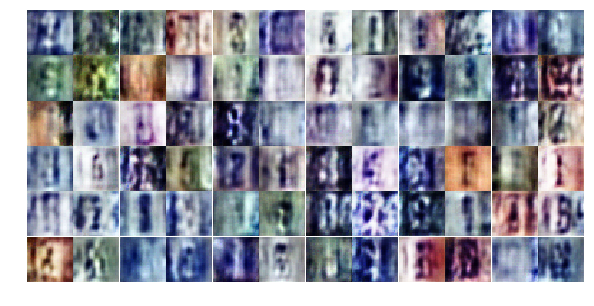

Epoch 3/25... Discriminator Loss: 0.8144... Generator Loss: 0.9696
Epoch 4/25... Discriminator Loss: 0.2600... Generator Loss: 1.7981
Epoch 4/25... Discriminator Loss: 0.2856... Generator Loss: 4.0088
Epoch 4/25... Discriminator Loss: 0.2503... Generator Loss: 3.0266
Epoch 4/25... Discriminator Loss: 0.3195... Generator Loss: 1.8593
Epoch 4/25... Discriminator Loss: 0.4718... Generator Loss: 1.4168
Epoch 4/25... Discriminator Loss: 0.0628... Generator Loss: 4.1260
Epoch 4/25... Discriminator Loss: 0.2518... Generator Loss: 2.1775
Epoch 4/25... Discriminator Loss: 0.2034... Generator Loss: 3.0055
Epoch 4/25... Discriminator Loss: 0.5244... Generator Loss: 1.2884


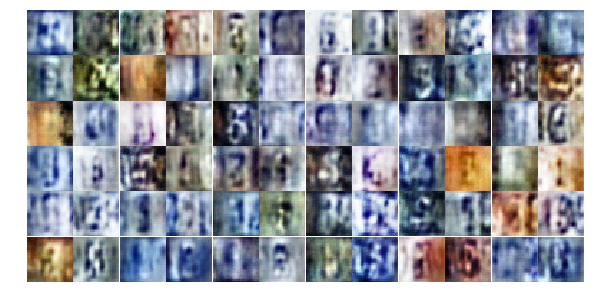

Epoch 4/25... Discriminator Loss: 0.1736... Generator Loss: 2.2701
Epoch 4/25... Discriminator Loss: 0.0769... Generator Loss: 3.4682
Epoch 4/25... Discriminator Loss: 0.5754... Generator Loss: 1.2182
Epoch 4/25... Discriminator Loss: 0.3124... Generator Loss: 2.4909
Epoch 4/25... Discriminator Loss: 0.6970... Generator Loss: 1.7063
Epoch 4/25... Discriminator Loss: 1.1287... Generator Loss: 0.5834
Epoch 4/25... Discriminator Loss: 0.3570... Generator Loss: 1.8987
Epoch 4/25... Discriminator Loss: 1.9381... Generator Loss: 0.2118
Epoch 4/25... Discriminator Loss: 0.3204... Generator Loss: 4.7159
Epoch 4/25... Discriminator Loss: 0.2454... Generator Loss: 2.3546


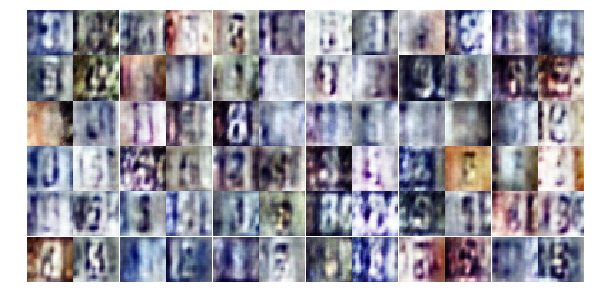

Epoch 4/25... Discriminator Loss: 0.4697... Generator Loss: 2.6482
Epoch 4/25... Discriminator Loss: 0.8495... Generator Loss: 0.8253
Epoch 4/25... Discriminator Loss: 0.3014... Generator Loss: 1.7989
Epoch 4/25... Discriminator Loss: 0.3423... Generator Loss: 2.2680
Epoch 4/25... Discriminator Loss: 0.2912... Generator Loss: 1.8825
Epoch 4/25... Discriminator Loss: 0.2567... Generator Loss: 1.9776
Epoch 4/25... Discriminator Loss: 0.5740... Generator Loss: 1.2796
Epoch 4/25... Discriminator Loss: 0.5308... Generator Loss: 3.3168
Epoch 4/25... Discriminator Loss: 0.4475... Generator Loss: 1.4523
Epoch 4/25... Discriminator Loss: 0.3979... Generator Loss: 1.5087


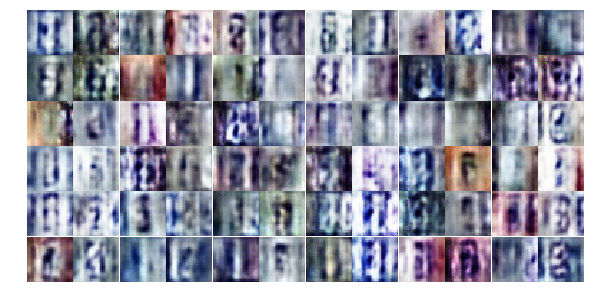

Epoch 4/25... Discriminator Loss: 0.5503... Generator Loss: 1.1763
Epoch 4/25... Discriminator Loss: 0.7560... Generator Loss: 0.9484
Epoch 4/25... Discriminator Loss: 0.2314... Generator Loss: 4.0336
Epoch 4/25... Discriminator Loss: 0.1179... Generator Loss: 4.6792
Epoch 4/25... Discriminator Loss: 1.4030... Generator Loss: 3.3554
Epoch 4/25... Discriminator Loss: 0.6607... Generator Loss: 1.2274
Epoch 4/25... Discriminator Loss: 0.5090... Generator Loss: 1.5429
Epoch 4/25... Discriminator Loss: 0.2347... Generator Loss: 2.7293
Epoch 4/25... Discriminator Loss: 1.4794... Generator Loss: 0.4350
Epoch 4/25... Discriminator Loss: 0.9070... Generator Loss: 0.7682


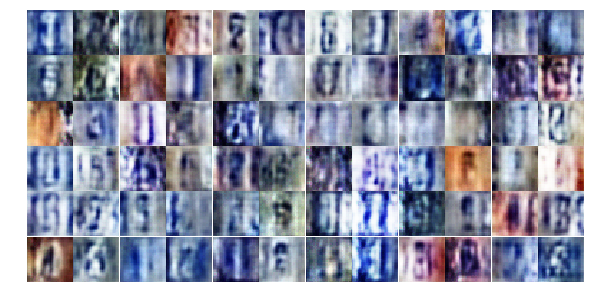

Epoch 4/25... Discriminator Loss: 0.1524... Generator Loss: 3.6736
Epoch 4/25... Discriminator Loss: 0.1131... Generator Loss: 7.3077
Epoch 4/25... Discriminator Loss: 0.4406... Generator Loss: 4.3838
Epoch 4/25... Discriminator Loss: 0.3636... Generator Loss: 1.7510
Epoch 4/25... Discriminator Loss: 0.1058... Generator Loss: 3.6968
Epoch 4/25... Discriminator Loss: 0.1832... Generator Loss: 2.9715
Epoch 4/25... Discriminator Loss: 0.1405... Generator Loss: 4.3535
Epoch 4/25... Discriminator Loss: 0.4955... Generator Loss: 2.1785
Epoch 4/25... Discriminator Loss: 0.5313... Generator Loss: 1.1142
Epoch 4/25... Discriminator Loss: 0.7570... Generator Loss: 2.4343


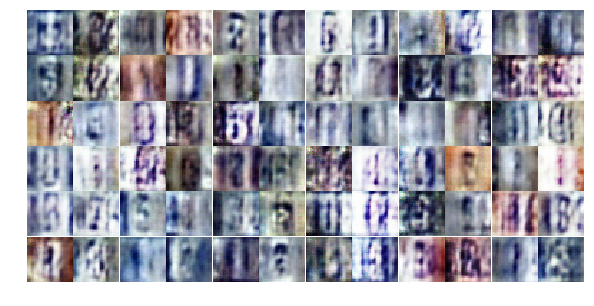

Epoch 4/25... Discriminator Loss: 1.1916... Generator Loss: 0.5228
Epoch 4/25... Discriminator Loss: 1.0997... Generator Loss: 3.3572
Epoch 4/25... Discriminator Loss: 0.4130... Generator Loss: 4.0221
Epoch 4/25... Discriminator Loss: 0.6109... Generator Loss: 1.0337
Epoch 4/25... Discriminator Loss: 0.2885... Generator Loss: 3.4627
Epoch 4/25... Discriminator Loss: 0.6918... Generator Loss: 1.0331
Epoch 4/25... Discriminator Loss: 0.1877... Generator Loss: 2.9320
Epoch 4/25... Discriminator Loss: 0.2971... Generator Loss: 2.2726
Epoch 4/25... Discriminator Loss: 0.1071... Generator Loss: 3.9599
Epoch 5/25... Discriminator Loss: 0.3146... Generator Loss: 2.2601


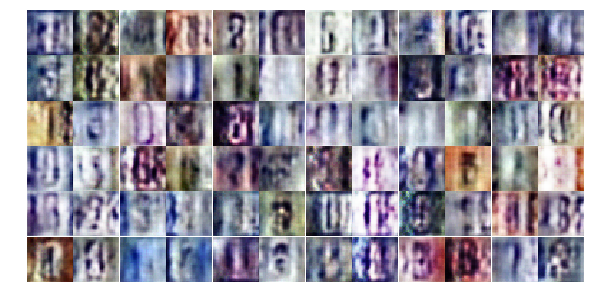

Epoch 5/25... Discriminator Loss: 0.4566... Generator Loss: 1.4736
Epoch 5/25... Discriminator Loss: 0.2084... Generator Loss: 2.7444
Epoch 5/25... Discriminator Loss: 0.3032... Generator Loss: 2.7366
Epoch 5/25... Discriminator Loss: 1.0166... Generator Loss: 0.7126
Epoch 5/25... Discriminator Loss: 0.5141... Generator Loss: 1.7576
Epoch 5/25... Discriminator Loss: 0.6493... Generator Loss: 2.5158
Epoch 5/25... Discriminator Loss: 1.1230... Generator Loss: 0.7033
Epoch 5/25... Discriminator Loss: 0.3172... Generator Loss: 2.5039
Epoch 5/25... Discriminator Loss: 0.6011... Generator Loss: 1.1877
Epoch 5/25... Discriminator Loss: 0.3293... Generator Loss: 2.5145


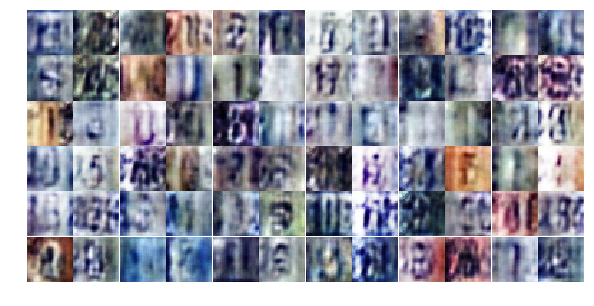

Epoch 5/25... Discriminator Loss: 0.6464... Generator Loss: 1.6378
Epoch 5/25... Discriminator Loss: 0.7106... Generator Loss: 0.9738
Epoch 5/25... Discriminator Loss: 0.2037... Generator Loss: 3.1952
Epoch 5/25... Discriminator Loss: 0.6302... Generator Loss: 1.1072
Epoch 5/25... Discriminator Loss: 0.5627... Generator Loss: 1.0775
Epoch 5/25... Discriminator Loss: 0.3684... Generator Loss: 4.3851
Epoch 5/25... Discriminator Loss: 0.5226... Generator Loss: 1.8366
Epoch 5/25... Discriminator Loss: 0.7948... Generator Loss: 0.9089
Epoch 5/25... Discriminator Loss: 0.2105... Generator Loss: 2.5931
Epoch 5/25... Discriminator Loss: 0.3701... Generator Loss: 1.6950


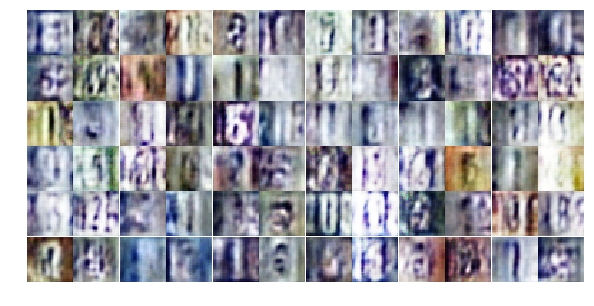

Epoch 5/25... Discriminator Loss: 0.6751... Generator Loss: 2.3291
Epoch 5/25... Discriminator Loss: 0.2781... Generator Loss: 2.1318
Epoch 5/25... Discriminator Loss: 0.1616... Generator Loss: 4.5991
Epoch 5/25... Discriminator Loss: 0.2564... Generator Loss: 1.9986
Epoch 5/25... Discriminator Loss: 0.1238... Generator Loss: 3.3606
Epoch 5/25... Discriminator Loss: 1.9717... Generator Loss: 0.2356
Epoch 5/25... Discriminator Loss: 1.1861... Generator Loss: 1.5893
Epoch 5/25... Discriminator Loss: 0.2107... Generator Loss: 5.1413
Epoch 5/25... Discriminator Loss: 0.1287... Generator Loss: 3.4205
Epoch 5/25... Discriminator Loss: 0.5199... Generator Loss: 4.5706


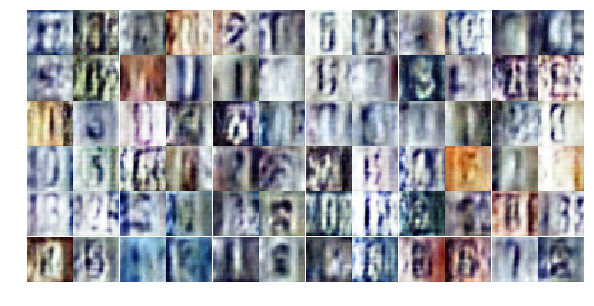

Epoch 5/25... Discriminator Loss: 0.7245... Generator Loss: 1.2116
Epoch 5/25... Discriminator Loss: 0.1641... Generator Loss: 4.0758
Epoch 5/25... Discriminator Loss: 0.1685... Generator Loss: 2.9834
Epoch 5/25... Discriminator Loss: 0.7193... Generator Loss: 0.9838
Epoch 5/25... Discriminator Loss: 1.8730... Generator Loss: 0.2342
Epoch 5/25... Discriminator Loss: 0.4870... Generator Loss: 2.9078
Epoch 5/25... Discriminator Loss: 0.1055... Generator Loss: 4.7556
Epoch 5/25... Discriminator Loss: 0.6261... Generator Loss: 1.1268
Epoch 5/25... Discriminator Loss: 0.3704... Generator Loss: 1.9204
Epoch 5/25... Discriminator Loss: 0.2761... Generator Loss: 2.4922


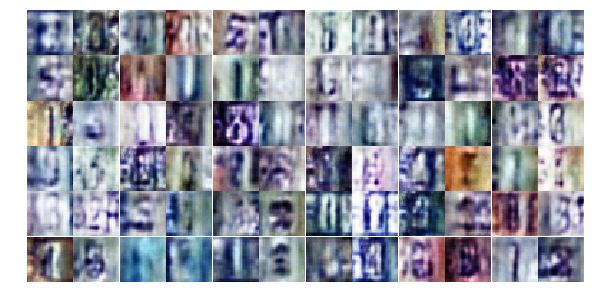

Epoch 5/25... Discriminator Loss: 0.1528... Generator Loss: 4.1510
Epoch 5/25... Discriminator Loss: 0.3236... Generator Loss: 2.8033
Epoch 5/25... Discriminator Loss: 0.0908... Generator Loss: 3.8488
Epoch 5/25... Discriminator Loss: 0.7297... Generator Loss: 1.0866
Epoch 5/25... Discriminator Loss: 0.5473... Generator Loss: 1.5930
Epoch 5/25... Discriminator Loss: 0.3826... Generator Loss: 1.8428
Epoch 5/25... Discriminator Loss: 0.2879... Generator Loss: 2.1056
Epoch 5/25... Discriminator Loss: 0.6344... Generator Loss: 3.3563
Epoch 5/25... Discriminator Loss: 0.3853... Generator Loss: 1.8006
Epoch 5/25... Discriminator Loss: 0.1852... Generator Loss: 2.5463


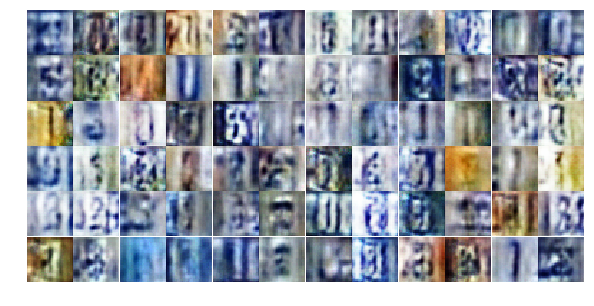

Epoch 5/25... Discriminator Loss: 0.2114... Generator Loss: 2.4161
Epoch 5/25... Discriminator Loss: 0.0985... Generator Loss: 3.5723
Epoch 5/25... Discriminator Loss: 0.1573... Generator Loss: 2.9850
Epoch 5/25... Discriminator Loss: 0.7121... Generator Loss: 1.0674
Epoch 5/25... Discriminator Loss: 0.5361... Generator Loss: 1.1982
Epoch 5/25... Discriminator Loss: 0.1394... Generator Loss: 3.2141
Epoch 6/25... Discriminator Loss: 0.4954... Generator Loss: 1.4307
Epoch 6/25... Discriminator Loss: 0.3027... Generator Loss: 2.1317
Epoch 6/25... Discriminator Loss: 0.1431... Generator Loss: 3.9656
Epoch 6/25... Discriminator Loss: 0.7238... Generator Loss: 0.9473


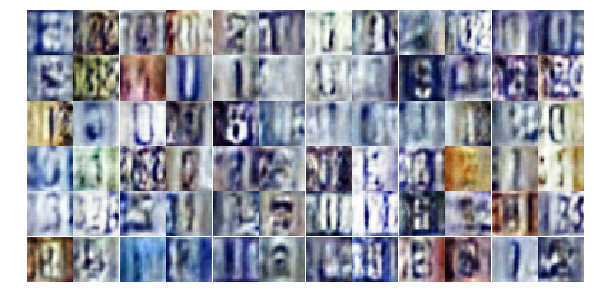

Epoch 6/25... Discriminator Loss: 0.1450... Generator Loss: 4.6809
Epoch 6/25... Discriminator Loss: 1.1095... Generator Loss: 0.5440
Epoch 6/25... Discriminator Loss: 0.6346... Generator Loss: 1.2570
Epoch 6/25... Discriminator Loss: 0.5651... Generator Loss: 1.2866
Epoch 6/25... Discriminator Loss: 0.0739... Generator Loss: 4.9685
Epoch 6/25... Discriminator Loss: 0.7801... Generator Loss: 1.7491
Epoch 6/25... Discriminator Loss: 0.6015... Generator Loss: 2.9997
Epoch 6/25... Discriminator Loss: 0.4104... Generator Loss: 1.8603
Epoch 6/25... Discriminator Loss: 0.6321... Generator Loss: 1.1721
Epoch 6/25... Discriminator Loss: 0.5836... Generator Loss: 3.8061


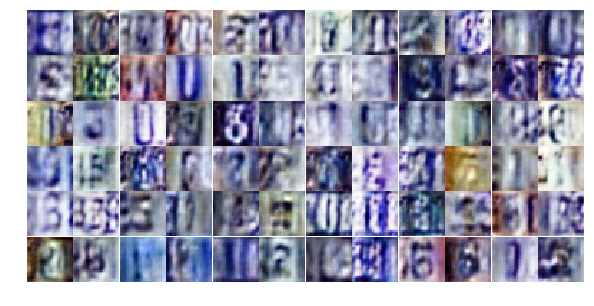

Epoch 6/25... Discriminator Loss: 0.1740... Generator Loss: 5.2939
Epoch 6/25... Discriminator Loss: 0.2209... Generator Loss: 2.1425
Epoch 6/25... Discriminator Loss: 0.3975... Generator Loss: 1.4933
Epoch 6/25... Discriminator Loss: 0.0642... Generator Loss: 4.8630
Epoch 6/25... Discriminator Loss: 0.1730... Generator Loss: 2.9111
Epoch 6/25... Discriminator Loss: 0.3424... Generator Loss: 2.4113
Epoch 6/25... Discriminator Loss: 0.2556... Generator Loss: 1.9480
Epoch 6/25... Discriminator Loss: 0.7048... Generator Loss: 1.0770
Epoch 6/25... Discriminator Loss: 0.2610... Generator Loss: 2.2764
Epoch 6/25... Discriminator Loss: 0.2609... Generator Loss: 2.4211


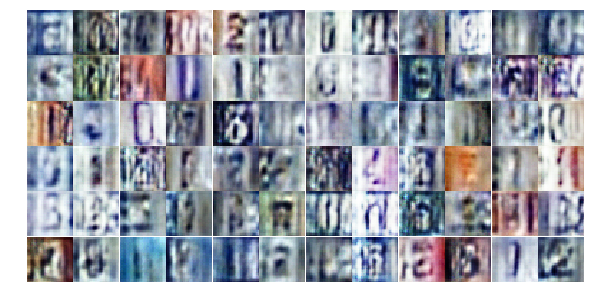

Epoch 6/25... Discriminator Loss: 0.1856... Generator Loss: 2.7521
Epoch 6/25... Discriminator Loss: 0.1669... Generator Loss: 4.0797
Epoch 6/25... Discriminator Loss: 0.2575... Generator Loss: 3.2806
Epoch 6/25... Discriminator Loss: 0.2936... Generator Loss: 2.8260
Epoch 6/25... Discriminator Loss: 0.9522... Generator Loss: 0.7260
Epoch 6/25... Discriminator Loss: 0.2588... Generator Loss: 3.6971
Epoch 6/25... Discriminator Loss: 0.3669... Generator Loss: 1.7880
Epoch 6/25... Discriminator Loss: 0.2227... Generator Loss: 2.2158
Epoch 6/25... Discriminator Loss: 0.3282... Generator Loss: 2.0808
Epoch 6/25... Discriminator Loss: 0.1226... Generator Loss: 5.5883


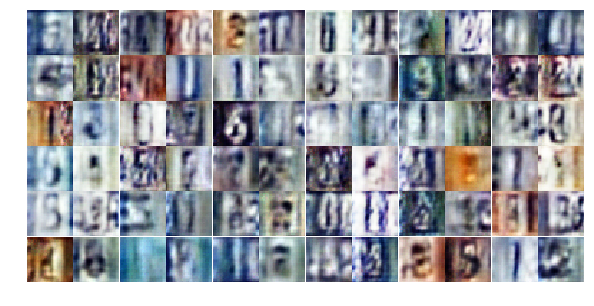

Epoch 6/25... Discriminator Loss: 0.7460... Generator Loss: 1.3310
Epoch 6/25... Discriminator Loss: 2.5612... Generator Loss: 0.7934
Epoch 6/25... Discriminator Loss: 0.4883... Generator Loss: 2.0668
Epoch 6/25... Discriminator Loss: 0.2079... Generator Loss: 2.4019
Epoch 6/25... Discriminator Loss: 0.5049... Generator Loss: 1.2847
Epoch 6/25... Discriminator Loss: 0.5884... Generator Loss: 1.1654
Epoch 6/25... Discriminator Loss: 0.5899... Generator Loss: 1.1424
Epoch 6/25... Discriminator Loss: 0.4206... Generator Loss: 2.6525
Epoch 6/25... Discriminator Loss: 0.1158... Generator Loss: 4.7098
Epoch 6/25... Discriminator Loss: 0.1183... Generator Loss: 3.6296


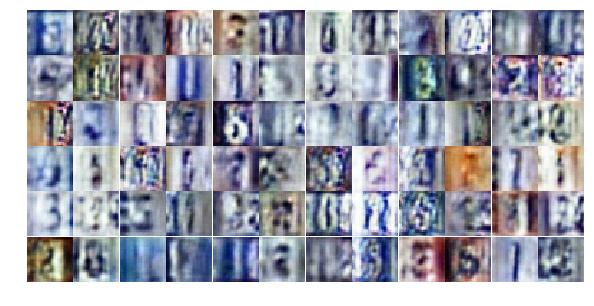

Epoch 6/25... Discriminator Loss: 0.3558... Generator Loss: 4.1363
Epoch 6/25... Discriminator Loss: 0.4458... Generator Loss: 2.6221
Epoch 6/25... Discriminator Loss: 0.4214... Generator Loss: 1.6127
Epoch 6/25... Discriminator Loss: 0.2379... Generator Loss: 2.6112
Epoch 6/25... Discriminator Loss: 0.2458... Generator Loss: 2.6287
Epoch 6/25... Discriminator Loss: 0.5565... Generator Loss: 2.5989
Epoch 6/25... Discriminator Loss: 0.8052... Generator Loss: 0.8436
Epoch 6/25... Discriminator Loss: 1.4599... Generator Loss: 0.4360
Epoch 6/25... Discriminator Loss: 0.8209... Generator Loss: 1.2655
Epoch 6/25... Discriminator Loss: 1.0266... Generator Loss: 0.6324


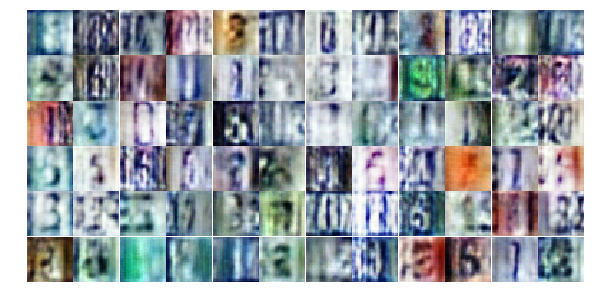

Epoch 6/25... Discriminator Loss: 0.7847... Generator Loss: 6.1209
Epoch 6/25... Discriminator Loss: 0.3248... Generator Loss: 1.8381
Epoch 6/25... Discriminator Loss: 0.4774... Generator Loss: 1.8952
Epoch 7/25... Discriminator Loss: 0.4871... Generator Loss: 1.3787
Epoch 7/25... Discriminator Loss: 0.2898... Generator Loss: 2.2497
Epoch 7/25... Discriminator Loss: 0.2867... Generator Loss: 2.4199
Epoch 7/25... Discriminator Loss: 0.1685... Generator Loss: 3.5198
Epoch 7/25... Discriminator Loss: 0.2832... Generator Loss: 2.2403
Epoch 7/25... Discriminator Loss: 0.2311... Generator Loss: 4.4737
Epoch 7/25... Discriminator Loss: 1.4002... Generator Loss: 0.3948


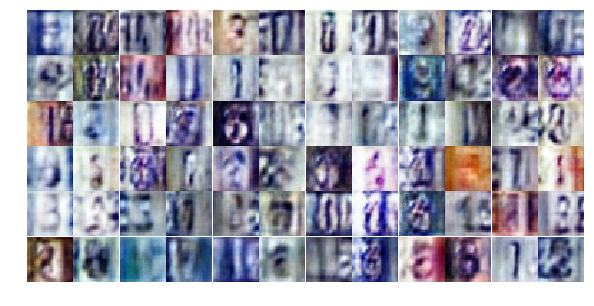

Epoch 7/25... Discriminator Loss: 0.7798... Generator Loss: 5.0987
Epoch 7/25... Discriminator Loss: 0.6962... Generator Loss: 1.0443
Epoch 7/25... Discriminator Loss: 0.6820... Generator Loss: 1.0539
Epoch 7/25... Discriminator Loss: 0.3782... Generator Loss: 1.8164
Epoch 7/25... Discriminator Loss: 0.3086... Generator Loss: 1.9437
Epoch 7/25... Discriminator Loss: 0.3108... Generator Loss: 1.9554
Epoch 7/25... Discriminator Loss: 0.3756... Generator Loss: 1.8825
Epoch 7/25... Discriminator Loss: 0.2828... Generator Loss: 1.9191
Epoch 7/25... Discriminator Loss: 0.4039... Generator Loss: 1.7213
Epoch 7/25... Discriminator Loss: 0.3059... Generator Loss: 1.8499


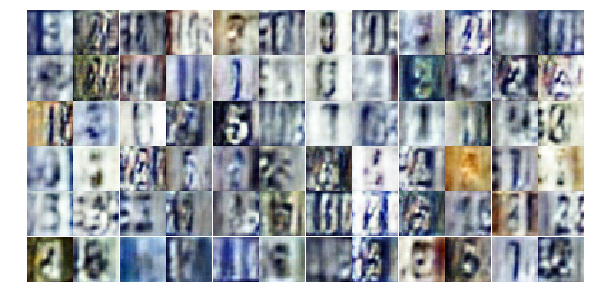

Epoch 7/25... Discriminator Loss: 0.2852... Generator Loss: 2.7406
Epoch 7/25... Discriminator Loss: 0.9530... Generator Loss: 1.0322
Epoch 7/25... Discriminator Loss: 0.1806... Generator Loss: 2.9758
Epoch 7/25... Discriminator Loss: 0.1876... Generator Loss: 2.7040
Epoch 7/25... Discriminator Loss: 0.4215... Generator Loss: 1.3826
Epoch 7/25... Discriminator Loss: 0.3386... Generator Loss: 2.0215
Epoch 7/25... Discriminator Loss: 0.1704... Generator Loss: 2.5047
Epoch 7/25... Discriminator Loss: 0.3646... Generator Loss: 1.7634
Epoch 7/25... Discriminator Loss: 0.3794... Generator Loss: 1.8279
Epoch 7/25... Discriminator Loss: 0.3297... Generator Loss: 1.6528


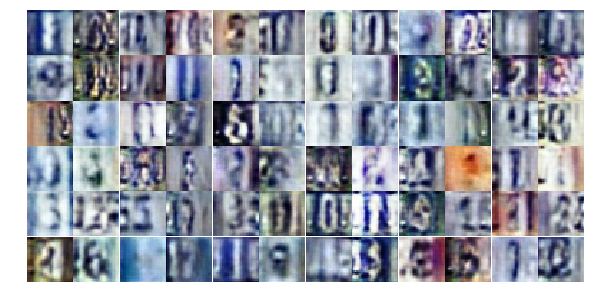

Epoch 7/25... Discriminator Loss: 0.1828... Generator Loss: 3.3799
Epoch 7/25... Discriminator Loss: 0.1771... Generator Loss: 2.3818
Epoch 7/25... Discriminator Loss: 0.1969... Generator Loss: 3.4727
Epoch 7/25... Discriminator Loss: 0.2248... Generator Loss: 2.2269
Epoch 7/25... Discriminator Loss: 0.1941... Generator Loss: 4.2304
Epoch 7/25... Discriminator Loss: 0.3770... Generator Loss: 2.3109
Epoch 7/25... Discriminator Loss: 0.3530... Generator Loss: 1.7807
Epoch 7/25... Discriminator Loss: 0.5609... Generator Loss: 1.3198
Epoch 7/25... Discriminator Loss: 0.4772... Generator Loss: 1.3769
Epoch 7/25... Discriminator Loss: 0.3730... Generator Loss: 1.5505


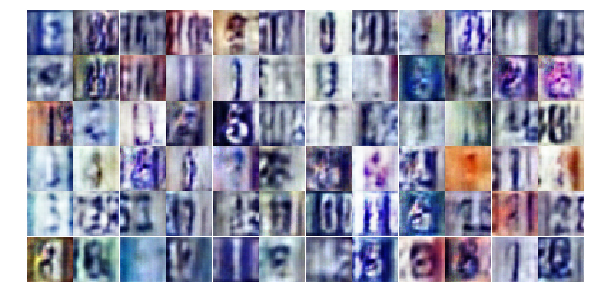

Epoch 7/25... Discriminator Loss: 0.4531... Generator Loss: 5.0790
Epoch 7/25... Discriminator Loss: 0.5386... Generator Loss: 2.6317
Epoch 7/25... Discriminator Loss: 1.2859... Generator Loss: 3.5021
Epoch 7/25... Discriminator Loss: 1.8361... Generator Loss: 0.4684
Epoch 7/25... Discriminator Loss: 0.5270... Generator Loss: 2.3702
Epoch 7/25... Discriminator Loss: 0.3557... Generator Loss: 1.8842
Epoch 7/25... Discriminator Loss: 0.5181... Generator Loss: 1.3377
Epoch 7/25... Discriminator Loss: 0.2722... Generator Loss: 2.6897
Epoch 7/25... Discriminator Loss: 0.1758... Generator Loss: 2.6237
Epoch 7/25... Discriminator Loss: 0.4312... Generator Loss: 1.5373


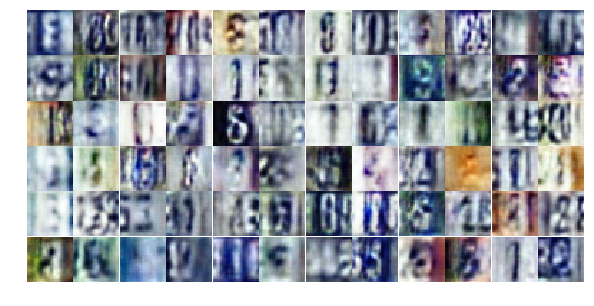

Epoch 7/25... Discriminator Loss: 0.2736... Generator Loss: 2.0255
Epoch 7/25... Discriminator Loss: 0.2057... Generator Loss: 2.5083
Epoch 7/25... Discriminator Loss: 0.4853... Generator Loss: 1.5015
Epoch 7/25... Discriminator Loss: 0.1495... Generator Loss: 2.9551
Epoch 7/25... Discriminator Loss: 0.3397... Generator Loss: 1.8110
Epoch 7/25... Discriminator Loss: 0.3161... Generator Loss: 1.8215
Epoch 7/25... Discriminator Loss: 0.4053... Generator Loss: 1.5838
Epoch 7/25... Discriminator Loss: 0.4592... Generator Loss: 1.5094
Epoch 7/25... Discriminator Loss: 0.5262... Generator Loss: 1.1895
Epoch 7/25... Discriminator Loss: 0.2013... Generator Loss: 2.3908


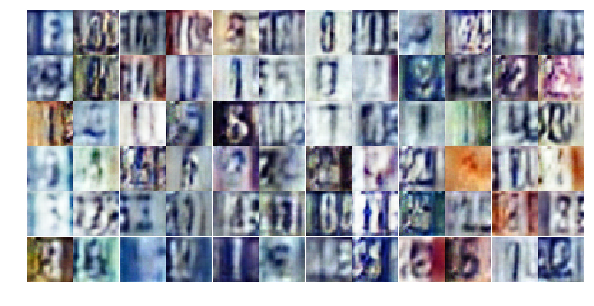

Epoch 7/25... Discriminator Loss: 0.1719... Generator Loss: 2.8357
Epoch 8/25... Discriminator Loss: 0.3245... Generator Loss: 2.0206
Epoch 8/25... Discriminator Loss: 3.0519... Generator Loss: 0.6986
Epoch 8/25... Discriminator Loss: 1.3230... Generator Loss: 0.6187
Epoch 8/25... Discriminator Loss: 0.8733... Generator Loss: 1.3514
Epoch 8/25... Discriminator Loss: 0.4931... Generator Loss: 1.8216
Epoch 8/25... Discriminator Loss: 0.8613... Generator Loss: 0.8281
Epoch 8/25... Discriminator Loss: 0.2927... Generator Loss: 2.8427
Epoch 8/25... Discriminator Loss: 1.2191... Generator Loss: 0.4950
Epoch 8/25... Discriminator Loss: 0.3840... Generator Loss: 1.9079


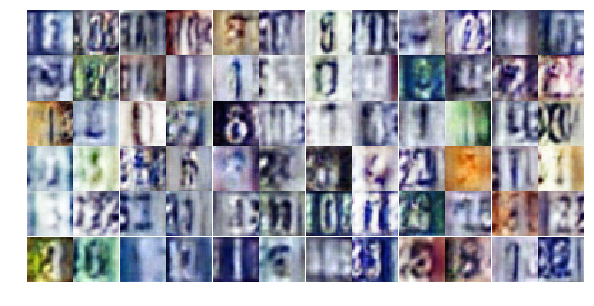

Epoch 8/25... Discriminator Loss: 0.2440... Generator Loss: 2.5853
Epoch 8/25... Discriminator Loss: 0.4102... Generator Loss: 1.5888
Epoch 8/25... Discriminator Loss: 0.3289... Generator Loss: 1.8516
Epoch 8/25... Discriminator Loss: 0.2291... Generator Loss: 2.5121
Epoch 8/25... Discriminator Loss: 0.3335... Generator Loss: 1.8011
Epoch 8/25... Discriminator Loss: 2.9477... Generator Loss: 5.5341
Epoch 8/25... Discriminator Loss: 0.6944... Generator Loss: 1.0458
Epoch 8/25... Discriminator Loss: 1.0652... Generator Loss: 0.6934
Epoch 8/25... Discriminator Loss: 0.5534... Generator Loss: 1.2556
Epoch 8/25... Discriminator Loss: 0.4458... Generator Loss: 1.6299


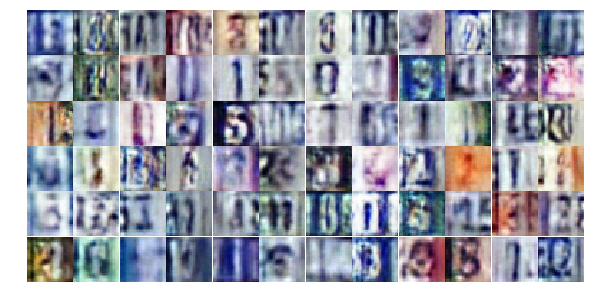

Epoch 8/25... Discriminator Loss: 0.3128... Generator Loss: 2.0281
Epoch 8/25... Discriminator Loss: 0.6643... Generator Loss: 0.9573
Epoch 8/25... Discriminator Loss: 0.4748... Generator Loss: 1.4001
Epoch 8/25... Discriminator Loss: 0.2852... Generator Loss: 1.8732
Epoch 8/25... Discriminator Loss: 0.2005... Generator Loss: 2.6949
Epoch 8/25... Discriminator Loss: 0.3433... Generator Loss: 2.1879
Epoch 8/25... Discriminator Loss: 0.3252... Generator Loss: 2.2984
Epoch 8/25... Discriminator Loss: 0.1920... Generator Loss: 2.5105
Epoch 8/25... Discriminator Loss: 0.4270... Generator Loss: 1.5124
Epoch 8/25... Discriminator Loss: 0.5161... Generator Loss: 1.2892


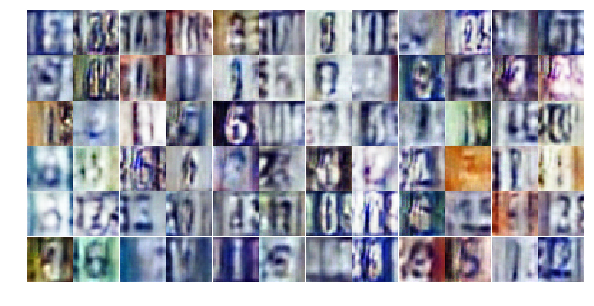

Epoch 8/25... Discriminator Loss: 0.3785... Generator Loss: 1.7899
Epoch 8/25... Discriminator Loss: 0.5769... Generator Loss: 1.0773
Epoch 8/25... Discriminator Loss: 0.3550... Generator Loss: 3.0387
Epoch 8/25... Discriminator Loss: 0.4091... Generator Loss: 1.5358
Epoch 8/25... Discriminator Loss: 1.2028... Generator Loss: 1.4238
Epoch 8/25... Discriminator Loss: 0.9721... Generator Loss: 1.9595


KeyboardInterrupt: 

In [43]:
# Load the data and train the network here
dataset = Dataset(trainset, testset)
losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

In [ ]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

In [ ]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))